# Sign Language Classification 📷 🚀

## Introduction
Speech-impaired individuals use hand signs and gestures to communicate. However, understanding their language can be challenging for those who are not familiar with it. This project aims to develop a system that recognizes different signs and gestures, facilitating communication for both speech-impaired and normal individuals.

### Objective
The objective of this project is to develop a convolutional deep learning neural network for the classification of sign language images.

### Dataset
The dataset used in this project consists of images of various hand signs and gestures. Each image is labeled with the corresponding sign or gesture.

### Problem Type
This project addresses a multiclass classification problem.

![hand signs.png](The-26-letters-and-10-digits-of-American-Sign-Language-ASL.png)


# Table of Content

1. [Introduction](#1)
2. [Data Description](#2)
3. [Loading Libraries](#3)
4. [Data Extraction](#4)
5. [Data Exploration](#5)
6. [Train Test Split](#6)
7. [Data Preparation](#7)
    1. [Image Data Generator](#8)
        1. [Flow from directory](#9)
8. [Deep Learning Model](#10)
    1. [Model Layers](#11)
    2. [Callbacks](#12)
    3. [Compile Model](#13)
    4. [Fit Model](#14)
    5. [Evaluation](#15)
    6. [Plot Result](#16)
9. [Prediction](#17)
10. [Classification Report](#18)
11. [Conclusion](#19)


<a id='1'></a>

# Introduction

In this article, we will explore the development of a Convolutional Neural Network (CNN) to classify images of American Sign Language.

After reading this article, you will learn:

- How to load and prepare images for training purposes.
- How to split data for training and validation.
- Understanding the necessity (or lack thereof) of applying Data Augmentation.
- Developing a CNN model using Keras and optimizing various parameters to improve model performance.
- Evaluating the performance of our model.
- Saving and loading a model for further predictions.
- Drawing the confusion matrix for the trained model.


<a id='2'></a>

# Data Description


The dataset is a collection of images representing alphabets from the American Sign Language, organized into 36 folders representing various classes.

- **Total Images:** 2515
- **Image Dimensions:** 400x400 pixels
- **Number of Classes:** 36

The 36 classes include alphanumeric characters:
- 0-9
- A-Z


<a id='3'></a>

# Loading Libraries


In [1]:
# Import necessary libraries
import os 
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import random

# Library for splitting data into train, validation, and test sets
import splitfolders

# Deep learning libraries
import tensorflow as tf
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Dropout, Flatten, MaxPooling2D, BatchNormalization, Input, concatenate
from keras.callbacks import EarlyStopping, ReduceLROnPlateau
from keras.utils import plot_model
import visualkeras

# Libraries for evaluating model performance
from sklearn.metrics import classification_report, confusion_matrix

<a id='4'></a>

# Data Extraction

In this part, we are going to extract an image of each class we have.


In [2]:
# Define the base path where the dataset is located
base_path = "asl_dataset/"

# Dictionary to map category indices to their corresponding labels
categories = { 0: "0", 1: "1", 2: "2", 3: "3", 4: "4", 5: "5", 6: "6", 7: "7", 8: "8", 9: "9", 10: "a", 11: "b", 12: "c",
           13: "d", 14: "e", 15: "f", 16: "g", 17: "h", 18: "i", 19: "j", 20: "k", 21: "l", 22: "m", 23: "n", 24: "o",
           25: "p", 26: "q", 27: "r", 28: "s", 29: "t", 30: "u", 31: "v", 32: "w", 33: "x", 34: "y", 35: "z" }

# Function to add class name prefix to filenames in DataFrame
def add_class_name_prefix(df, col_name):
    df[col_name] = df[col_name].apply(
        lambda x: x[re.search("_", x).start() + 1 : re.search("_", x).start() + 2]
        + "/"
        + x
    )
    return df

# List to store filenames and corresponding categories
filenames_list = []
categories_list = []

# Iterate through each category
for category in categories:
    # Get list of filenames in the current category folder
    filenames = os.listdir(base_path + categories[category])
    # Append filenames and corresponding category index to the lists
    filenames_list += filenames
    categories_list += [category] * len(filenames)

# Create a DataFrame from the lists of filenames and categories
df = pd.DataFrame({"filename": filenames_list, "category": categories_list})
# Add class name prefix to filenames
df = add_class_name_prefix(df, "filename")

# Shuffle the DataFrame
df = df.sample(frac=1).reset_index(drop=True)

In [3]:
df

,filename,category
0,5/hand2_5_dif_seg_4_cropped.jpeg,5
1,9/hand4_9_bot_seg_4_cropped.jpeg,9
2,b/hand5_b_dif_seg_4_cropped.jpeg,11
3,c/hand2_c_right_seg_1_cropped.jpeg,12
4,o/hand3_o_dif_seg_5_cropped.jpeg,24
...,...,...
2510,x/hand4_x_bot_seg_1_cropped.jpeg,33
2511,o/hand2_o_dif_seg_1_cropped.jpeg,24
2512,9/hand2_9_dif_seg_3_cropped.jpeg,9
2513,n/hand1_n_dif_seg_4_cropped.jpeg,23


In [4]:
# Print the number of elements in the DataFrame
print("Number of elements =", len(df))


Number of elements = 2515


<a id='5'></a>

# Data Exploration
        
Data exploration is a crucial step in understanding the characteristics of our dataset. In this section, we will visualize the variable of interest by examining images from the American Sign Language (ASL) dataset.

Let's start by visualizing a few images in a grid format to gain insight into the diversity of hand signs represented in the dataset.

<h5 style="text-align:center;color:Green">We visualize a few images of American Sign Language (ASL).</h5>


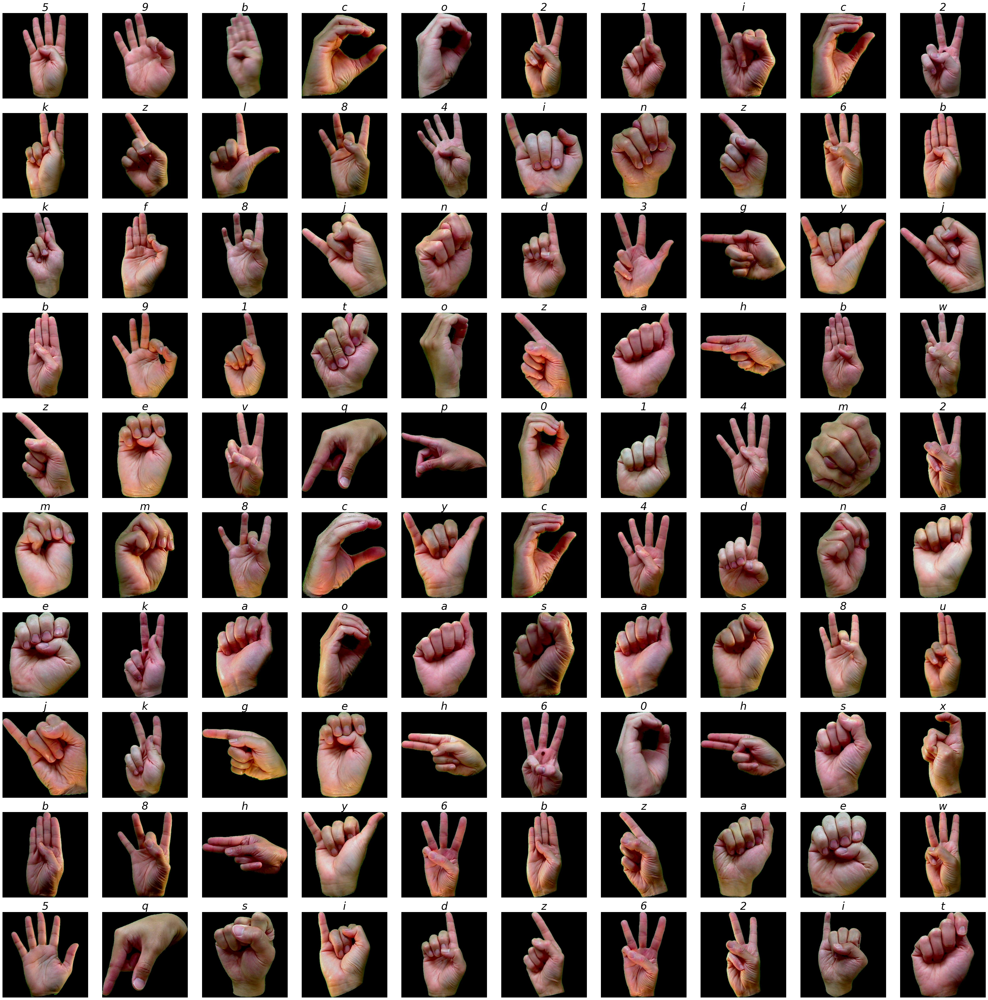

In [5]:
# Set the figure size for the plot
plt.figure(figsize=(40,40))

# Iterate over a subset of the DataFrame (first 100 elements)
for i in range(100):
    # Construct the full path to the image file
    path = base_path + df.filename[i]
    # Read the image
    img = plt.imread(path)
    # Create subplots in a 10x10 grid, with the index i + 1
    plt.subplot(10,10, i + 1)
    # Display the image
    plt.imshow(img)
    # Set the title of the subplot to the corresponding category label
    plt.title(categories[df.category[i]],fontsize=30,fontstyle='italic')
    # Turn off axis labels
    plt.axis("off")

# Add spacing between subplots to avoid overlap
plt.tight_layout()

# Save the plot as an image
plt.savefig('Images/ASL_Visualization.png')

# Show the plot
plt.show()


Now, we will see the distrubution of data in every class.

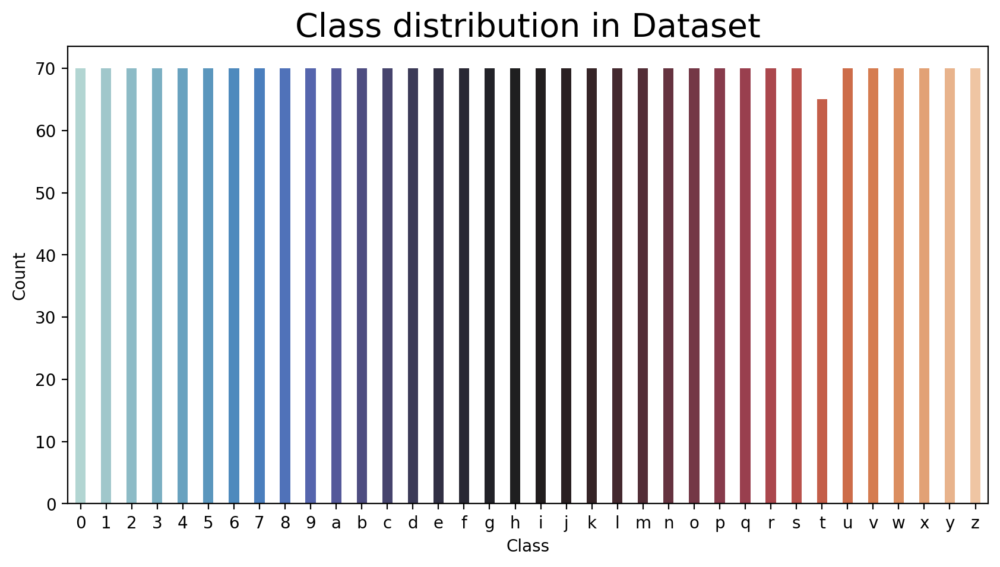

In [6]:
# Calculate the count of each category in the DataFrame
label, count = np.unique(df.category, return_counts=True)

# Create a DataFrame to store the counts with class labels as indices
uni = pd.DataFrame(data=count, index=categories.values(), columns=['Count'])

# Set the figure size and dpi for the plot
plt.figure(figsize=(10, 5), dpi=200)

# Create a bar plot using seaborn
sns.barplot(data=uni, x=uni.index, y='Count', palette='icefire', width=0.4)

# Set title and font size for the plot
plt.title('Class distribution in Dataset', fontsize=20)

# Set labels for x-axis and y-axis
plt.xlabel('Class')
plt.ylabel('Count')

# Save the plot as an image
plt.savefig('Images/Class_Distribution_in_Dataset.png')

# Show the plot
plt.show()


<a id='6'></a>

# Train Test Split 
        
Splitting the dataset into training, validation, and testing sets is essential for assessing the performance of our model. In this step, we will divide the data as follows:

- **Training Dataset (80%):** This portion of the data will be used to train the model. The model learns from this data to make predictions.
  
- **Validation Dataset (10%):** A small portion of the data is set aside for validation. This dataset helps us fine-tune the model's hyperparameters and assess its performance during training.
  
- **Testing Dataset (10%):** The testing dataset serves as an unseen set of data to evaluate the final performance of our trained model. It ensures that the model's performance generalizes well to new, unseen data.


In [7]:
# Split the dataset located at 'asl_dataset' into training, validation, and test sets,
# and save the split data into the 'working/' directory. 
# The seed parameter ensures reproducibility of the split.
# The ratio parameter specifies the proportions for train, validation, and test sets (80%, 10%, 10%).
splitfolders.ratio('asl_dataset', output='dataset/', seed=1333, ratio=(0.8, 0.1, 0.1))


Copying files: 2515 files [00:04, 591.48 files/s]


<a id='7'></a>

# Data Preparation

Data preparation is a crucial step in any machine learning project. In this section, we will preprocess the dataset to make it suitable for training our model. This involves tasks such as normalization, resizing, and data augmentation (if applicable).


<a id='8'></a>

# Image Data Generator

In this section, we will use the `ImageDataGenerator` class provided by Keras to preprocess and augment our image data on-the-fly during training. This approach helps in efficiently feeding the data to the model without loading all the images into memory at once.

* We will utilize the `flow_from_directory` method, which allows us to load images directly from the directory structure.
* We'll set the batch size to 32, meaning the model will be trained on 32 images at a time.
* The images will be resized to a shape of (200, 200) to match the input size expected by our model.
* Additionally, we will use the `rescale` parameter of the `ImageDataGenerator` to normalize the pixel values of the images.


In [8]:
# Create an instance of ImageDataGenerator for data preprocessing and augmentation.
# Rescale the pixel values of images to a range between 0 and 1 by dividing by 255.
datagen = ImageDataGenerator(rescale=1.0 / 255)


Finally, we will list out all the important parameters and respective values.

In [9]:
# Define paths for the training, validation, and test datasets
train_path = 'dataset/train'  # Path to the training dataset
val_path = 'dataset/val'      # Path to the validation dataset
test_path = 'dataset/test'    # Path to the test dataset

# Define batch size for training
batch = 32

# Define image size (assuming square images)
image_size = 200

# Define number of channels in images (e.g., 3 for RGB images)
img_channel = 3

# Define number of classes in the dataset
n_classes = 36  # As there are 36 classes


<a id='9'></a>

# Flow from Directory

In this step, we will import the data directly from the directory structure using the `flow_from_directory` method of the `ImageDataGenerator` class.

* This method simplifies the process of loading images by automatically categorizing them based on the directory structure.
* We will set the parameter `shuffle` to False for the test data. This ensures that the order of the images remains unchanged during testing, allowing us to accurately evaluate the model's performance.


In [10]:
# Create data generators for training, validation, and test datasets using ImageDataGenerator
# For training data
train_data = datagen.flow_from_directory(
    directory=train_path,                                         
    target_size=(image_size, image_size),   # Resize images to the specified dimensions                                         
    batch_size=batch,                       # Set batch size for training                                     
    class_mode='categorical'                # Use categorical class mode
)

# For validation data
val_data = datagen.flow_from_directory(
    directory=val_path,                                       
    target_size=(image_size, image_size),   # Resize images to the specified dimensions                                       
    batch_size=batch,                       # Set batch size for validation                                       
    class_mode='categorical'                # Use categorical class mode
)

# For test data
test_data = datagen.flow_from_directory(
    directory=test_path,                                        
    target_size=(image_size, image_size),   # Resize images to the specified dimensions                                        
    batch_size=batch,                       # Set batch size for testing                                        
    class_mode='categorical',               # Use categorical class mode                                     
    shuffle=False                           # Do not shuffle the test data
)


Found 2012 images belonging to 36 classes.
Found 251 images belonging to 36 classes.
Found 252 images belonging to 36 classes.


<a id='10'></a>

# Deep Learning Model


<a id='11'></a>

# Model Layers

### Architecture

The architecture of the American Sign Language Image Classification model consists of the following Layers and components:

#### Layers:
- **Input Layer:** This layer receives input images for classification.
- **Convolutional Layers:** The model contains three blocks of convolution with increasing filters and ReLU activation function.
- **Pooling Layers:** Each convolution block is followed by a MaxPooling layer (pool_size = 2) to reduce the spatial dimensions of the feature maps.
- **Dropout Layers:** Dropout layers with a rate of 0.2 are included after each pooling layer to prevent overfitting.
- **Fully Connected Layers:** The model includes a Flatten layer to convert the 2D feature maps into a 1D vector, followed by a Dense layer with 512 units and a Dropout layer.
- **Output Layer:** The output layer is a Dense layer with 36 units (representing the number of classes) and softmax activation function for multiclass classification.

#### Components:
- **Input Layer:** Receives input images for classification.
- **Convolutional Layers:** Extract features from the images through convolutional operations.
- **Pooling Layers:** Reduce the spatial dimensions of the feature maps.
- **Flatten Layer:** Convert the 2D feature maps into a 1D vector.
- **Fully Connected Layers:** Perform classification using densely connected layers.
- **Output Layer:** Provides the final prediction probabilities for the 36 classes representing American Sign Language alphabets and numbers.


In [11]:
# Create a Sequential model
model = Sequential()

# Input layer and Block 1
model.add(Conv2D(32, 3, activation='relu', padding='same', input_shape=(image_size, image_size, img_channel)))
model.add(Conv2D(32, 3, activation='relu', padding='same'))
#model.add(BatchNormalization())  # Batch Normalization layer
model.add(MaxPooling2D(padding='same'))
model.add(Dropout(0.2))  # Dropout layer to prevent overfitting

# Block 2
model.add(Conv2D(64, 3, activation='relu', padding='same'))
model.add(Conv2D(64, 3, activation='relu', padding='same'))
#model.add(BatchNormalization())  # Batch Normalization layer
model.add(MaxPooling2D(padding='same'))
model.add(Dropout(0.3))  # Dropout layer

# Block 3
model.add(Conv2D(128, 3, activation='relu', padding='same'))
model.add(Conv2D(128, 3, activation='relu', padding='same'))
#model.add(BatchNormalization())  # Batch Normalization layer
model.add(MaxPooling2D(padding='same'))
model.add(Dropout(0.4))  # Dropout layer

# Flatten the output to feed into fully connected layers
model.add(Flatten())

# Fully connected layers
model.add(Dense(512, activation='relu'))  # Dense layer with 512 units and ReLU activation
model.add(Dropout(0.2))  # Dropout layer
model.add(Dense(128, activation='relu'))  # Dense layer with 128 units and ReLU activation
model.add(Dropout(0.3))  # Dropout layer

# Output layer with softmax activation for multiclass classification
model.add(Dense(36, activation='softmax'))  # 36 output units for 36 classes

# Print model summary to display the architecture
model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 200, 200, 32)      896       
                                                                 
 conv2d_1 (Conv2D)           (None, 200, 200, 32)      9248      
                                                                 
 max_pooling2d (MaxPooling2  (None, 100, 100, 32)      0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 100, 100, 32)      0         
                                                                 
 conv2d_2 (Conv2D)           (None, 100, 100, 64)      18496     
                                                                 
 conv2d_3 (Conv2D)           (None, 100, 100, 64)      36928     
                                                        

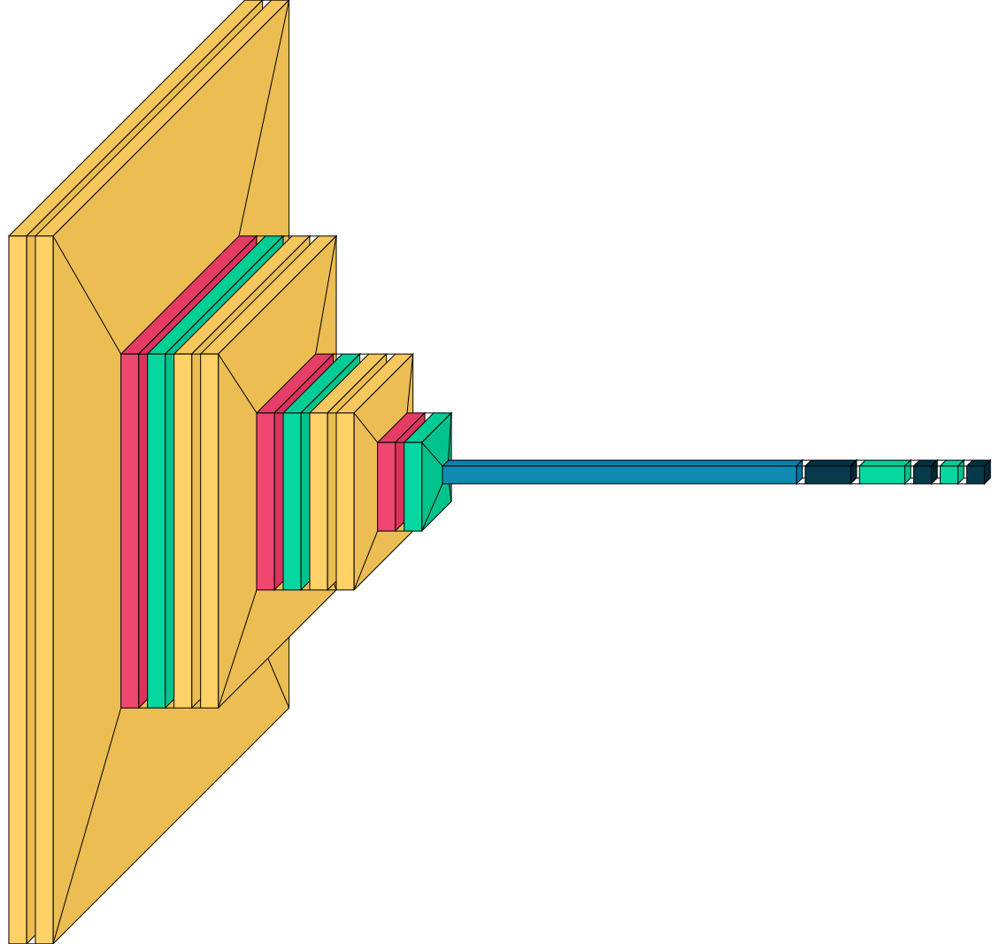

In [12]:
visualkeras.layered_view(model)

<a id='12'></a>

# Callbacks

In this section, we will implement two important callbacks to monitor and improve the training process:

* **ReduceLROnPlateau:** This callback dynamically adjusts the learning rate of the optimizer when a specified metric has stopped improving. It helps prevent the model from getting stuck in local minima by reducing the learning rate.
  
* **EarlyStopping:** This callback stops the training process when a monitored metric (e.g., validation loss) has stopped improving. It prevents overfitting by halting training when the model's performance on the validation set begins to degrade.

These callbacks play a crucial role in optimizing the training process and improving the overall performance of the model.


In [13]:
# EarlyStopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',         # Monitor validation loss                               
    min_delta=0.001,            # Minimum change in the monitored quantity to qualify as an improvement                               
    patience=5,                 # Number of epochs with no improvement after which training will be stopped                               
    restore_best_weights=True,  # Restore model weights to the best iteration                               
    verbose=0                   # Verbosity mode (0: silent, 1: update messages)
)

# ReduceLROnPlateau callback
reduce_learning_rate = ReduceLROnPlateau(
    monitor='val_accuracy',  # Monitor validation accuracy                                         
    patience=2,              # Number of epochs with no improvement after which learning rate will be reduced                                         
    factor=0.5,              # Factor by which the learning rate will be reduced (new_lr = lr * factor)                                        
    verbose=1                # Verbosity mode (0: silent, 1: update messages)
)


<a id='13'></a>

# Compile the Model

Finally, we will compile the model. There are three key components to mention here: the optimizer, the loss function, and the evaluation metrics.

* **Optimizer:** Optimizers are algorithms or methods used to minimize the cost function during training by updating the model parameters. Popular optimizers include gradient descent, stochastic gradient descent, and Adam. In this model, we are using the default optimizer, Adam.

* **Loss Function:** The loss function measures the difference between the actual output of the model and the predicted output. It quantifies how well the model is performing during training. For binary classification problems, 'binary_crossentropy' is commonly used, while 'categorical_crossentropy' is used for multiclass classification. Here, we are using binary_crossentropy as the loss function.

* **Metrics:** Metrics are used to evaluate the performance of the model. Common metrics include accuracy, precision, recall, and F1-score. We use these metrics to assess how well the model is performing on the validation or test data. In this case, we can use accuracy as the metric to measure the model's performance.


In [14]:
# Compile the model with specified optimizer, loss function, and evaluation metrics
model.compile(
    optimizer='adam',                 # Adam optimizer              
    loss='categorical_crossentropy',  # Categorical cross-entropy loss function           
    metrics=['accuracy']              # Accuracy metric for evaluation
)


<a id='14'></a>

# Fit the Model

Now, we will train our compiled model using the training data and validate it using the validation dataset during training.

We need to specify the number of steps for the training and validation iterators. This is the number of batches that will constitute one epoch. It can be determined by dividing the total number of images in the training and validation directories by the batch size (32).

The model will be trained for 30 epochs to ensure convergence and optimize its performance.


In [15]:
# Train the model using the fit() method
asl_class = model.fit(
    train_data,                                       # Training data generator                   
    validation_data=val_data,                         # Validation data generator                    
    epochs=30,                                        # Number of epochs                      
    callbacks=[early_stopping, reduce_learning_rate], # Callbacks for early stopping and reducing learning rate                   
    verbose=1                                         # Verbosity mode (1: progress bar)
)


Epoch 1/30
63/63 [==============================] - 186s 3s/step - loss: 2.4008 - accuracy: 0.3375 - val_loss: 0.5411 - val_accuracy: 0.8247 - lr: 0.0010
Epoch 2/30
63/63 [==============================] - 180s 3s/step - loss: 0.6406 - accuracy: 0.8111 - val_loss: 0.2249 - val_accuracy: 0.9243 - lr: 0.0010
Epoch 3/30
63/63 [==============================] - 176s 3s/step - loss: 0.3408 - accuracy: 0.8872 - val_loss: 0.1851 - val_accuracy: 0.9323 - lr: 0.0010
Epoch 4/30
63/63 [==============================] - 176s 3s/step - loss: 0.2007 - accuracy: 0.9324 - val_loss: 0.1470 - val_accuracy: 0.9442 - lr: 0.0010
Epoch 5/30
63/63 [==============================] - 167s 3s/step - loss: 0.1627 - accuracy: 0.9538 - val_loss: 0.0898 - val_accuracy: 0.9641 - lr: 0.0010
Epoch 6/30
63/63 [==============================] - 168s 3s/step - loss: 0.1034 - accuracy: 0.9682 - val_loss: 0.1172 - val_accuracy: 0.9641 - lr: 0.0010
Epoch 7/30
63/63 [==============================] - ETA: 0s - loss: 0.0730 -

In [16]:
model.save('sign_language_classifiers.keras')  # Save as Keras format

<a id='15'></a>

# Evaluation

In this section, we will evaluate the performance of our model on both the training and validation datasets by examining the accuracy and loss metrics.

It's essential to assess the model's performance on both datasets to ensure that it generalizes well to unseen data and does not overfit to the training data.

We will analyze the following metrics:
- Training accuracy
- Training loss
- Validation accuracy
- Validation loss

These metrics will provide insights into how well our model is learning and generalizing from the data.


In [20]:
# Evaluate the model on the training data
loss, acc = model.evaluate(train_data, verbose=0)                    # Evaluate model on training data
print('The accuracy of the model for training data is:', acc * 100)  # Print accuracy on training data
print('The Loss of the model for training data is:', loss)           # Print loss on training data

# Evaluate the model on the validation data
loss, acc = model.evaluate(val_data, verbose=0)                        # Evaluate model on validation data
print('The accuracy of the model for validation data is:', acc * 100)  # Print accuracy on validation data
print('The Loss of the model for validation data is:', loss)           # Print loss on validation data


The accuracy of the model for training data is: 99.90059733390808
The Loss of the model for training data is: 0.0026449922006577253
The accuracy of the model for validation data is: 97.60956168174744
The Loss of the model for validation data is: 0.061777323484420776


<a id='16'></a>

# Plot the Results

In this section, we will visualize the results of our model training and evaluation using plots. Plotting the results helps us understand the training progress and identify any issues such as overfitting or underfitting.

We will create plots for:
- Training and validation accuracy over epochs
- Training and validation loss over epochs

These plots will provide valuable insights into the performance of our model and help us make informed decisions for further optimization.


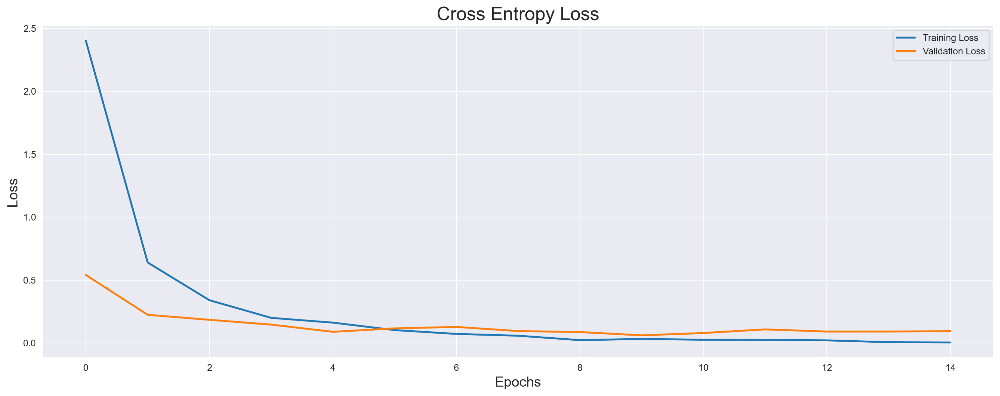

In [21]:
# Create a DataFrame from the training history of the model
error = pd.DataFrame(asl_class.history)

# Set up the plotting environment
plt.figure(figsize=(15, 6), dpi=200)
sns.set_style('darkgrid')

# Plot training and validation loss
plt.title('Cross Entropy Loss', fontsize=20)
plt.xlabel('Epochs', fontsize=15)
plt.ylabel('Loss', fontsize=15)
plt.plot(error['loss'], label='Training Loss', linewidth=2)
plt.plot(error['val_loss'], label='Validation Loss', linewidth=2)
plt.legend()
plt.grid(True)

# Add spacing between subplots to avoid overlap
plt.tight_layout()

# Save the plot as an image
plt.savefig('Images/Cross_Entropy_Loss.png')

# Show the plot
plt.show()


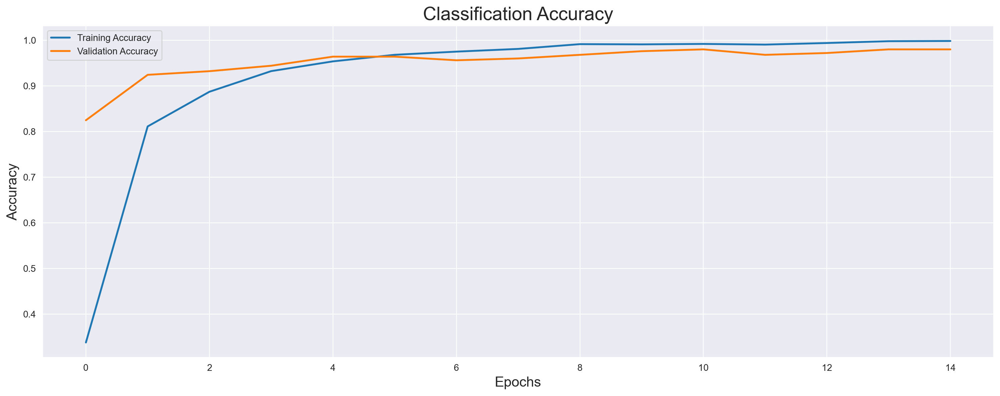

In [22]:
# Set up the plotting environment
plt.figure(figsize=(15, 6), dpi=200)
sns.set_style('darkgrid')

# Plot training and validation accuracy
plt.title('Classification Accuracy', fontsize=20)
plt.xlabel('Epochs', fontsize=15)
plt.ylabel('Accuracy', fontsize=15)
plt.plot(error['accuracy'], label='Training Accuracy', linewidth=2)
plt.plot(error['val_accuracy'], label='Validation Accuracy', linewidth=2)
plt.legend()
plt.grid(True)

# Add spacing between subplots to avoid overlap
plt.tight_layout()

# Save the plot as an image
plt.savefig('Images/Classification_Accuracy.png')

# Show the plot
plt.show()


<a id='17'></a>

# Prediction

In this section, we will use our trained model to make predictions on the test data. By predicting the labels for the test data, we can assess the accuracy and performance of our model on unseen data.

This step is crucial for evaluating the real-world effectiveness of our model and determining whether it generalizes well to new, unseen examples.

Let's proceed with making predictions and analyzing the results to understand how well our model performs on the test dataset.


In [23]:
# Perform predictions on the test data
result = model.predict(test_data, verbose=0)  # Predict probabilities for each class
y_pred = np.argmax(result, axis=1)            # Get the predicted class labels (indices with highest probability)

# Get the true labels of the test data
y_true = test_data.labels

# Evaluate the model on the test data
loss, acc = model.evaluate(test_data, verbose=0)  # Evaluate model's performance on test data
print('The accuracy of the model for testing data is:', acc*100)  # Print accuracy on test data
print('The Loss of the model for testing data is:', loss)        # Print loss on test data


The accuracy of the model for testing data is: 94.84127163887024
The Loss of the model for testing data is: 0.28015926480293274


The count of correctly and incorrectly classified images.

In [24]:
p = y_pred
y = y_true

# Get indices of correctly and incorrectly predicted classes
correct = np.nonzero(p == y)[0]     # Indices where predicted class matches true class
incorrect = np.nonzero(p != y)[0]   # Indices where predicted class does not match true class

# Print the number of correct and incorrect predictions
print("Correctly predicted classes:", correct.shape[0])      # Number of correct predictions
print("Incorrectly predicted classes:", incorrect.shape[0])  # Number of incorrect predictions


Correctly predicted classes: 239
Incorrectly predicted classes: 13


<a id='18'></a>

# Classification Report

A classification report is a tool used in machine learning for evaluating the performance of a classification model. It provides a summary of various evaluation metrics such as precision, recall, F1-score, and support for each class in the classification problem.

Here's a brief overview of the metrics typically included in a classification report:

- **Precision:** Precision is the ratio of true positive predictions to the total number of positive predictions made by the model. It measures the accuracy of positive predictions.

- **Recall (also called Sensitivity or True Positive Rate):** Recall is the ratio of true positive predictions to the total number of actual positive instances in the data. It measures the ability of the model to correctly identify positive instances.

- **F1-score:** The F1-score is the harmonic mean of precision and recall. It provides a single score that balances both precision and recall. F1-score is especially useful when there is an uneven class distribution.

- **Support:** Support is the number of actual occurrences of each class in the test dataset.

The classification report typically organizes these metrics for each class in the classification problem, as well as providing an overall summary of the model's performance.

It's important to analyze the classification report to understand how well the model performs for each class and to identify any potential issues such as class imbalance, misclassification patterns, or overall model effectiveness.

In [25]:
# Generate classification report
report = classification_report(y_true, y_pred, target_names=categories.values())

# Print the classification report
print(report)


              precision    recall  f1-score   support

           0       0.88      1.00      0.93         7
           1       0.70      1.00      0.82         7
           2       0.86      0.86      0.86         7
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00         7
           5       1.00      1.00      1.00         7
           6       0.83      0.71      0.77         7
           7       1.00      1.00      1.00         7
           8       1.00      1.00      1.00         7
           9       1.00      1.00      1.00         7
           a       1.00      1.00      1.00         7
           b       1.00      0.86      0.92         7
           c       1.00      1.00      1.00         7
           d       1.00      1.00      1.00         7
           e       1.00      1.00      1.00         7
           f       1.00      1.00      1.00         7
           g       1.00      0.86      0.92         7
           h       1.00    

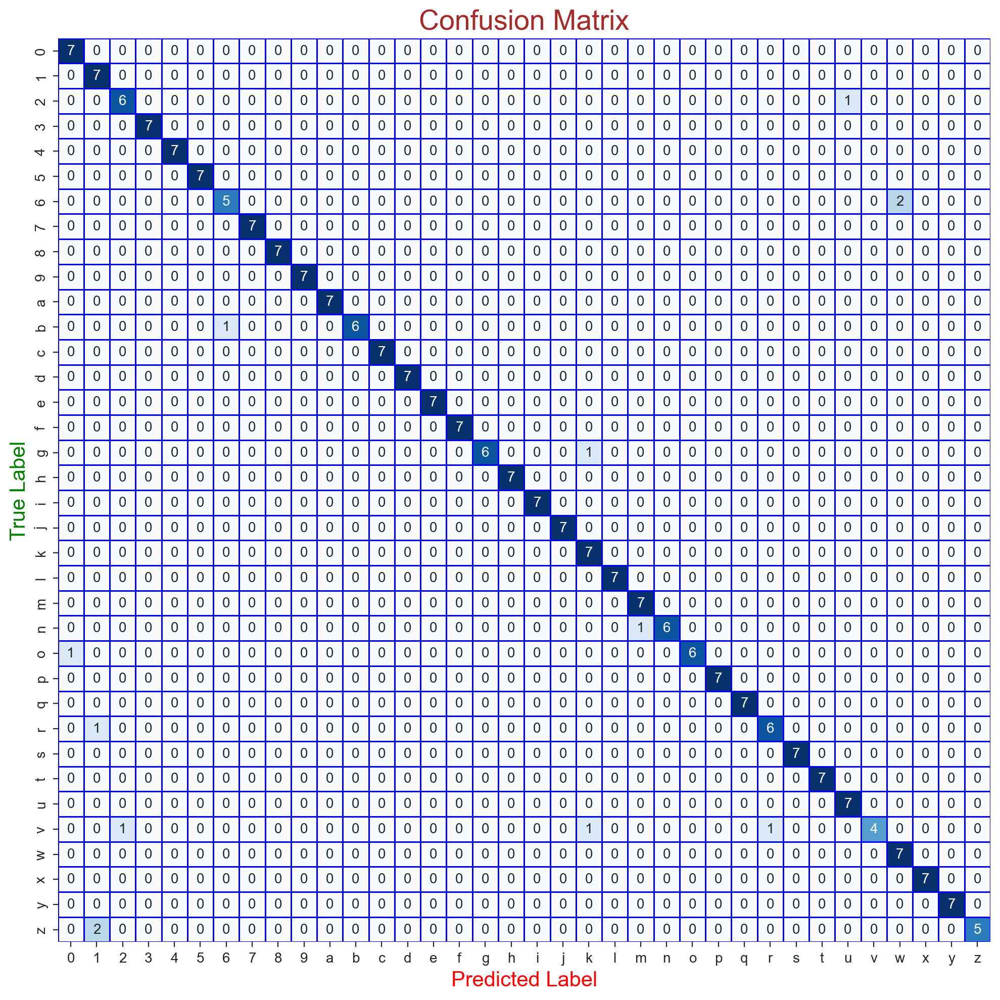

In [26]:
# Set seaborn style to 'ticks'
sns.set_style('ticks')

# Generate the confusion matrix
confusion_mtx = confusion_matrix(y_true, y_pred) 

# Create a matplotlib subplot
f, ax = plt.subplots(figsize=(10, 10), dpi=200)

# Plot the heatmap with improved aesthetics
sns.heatmap(confusion_mtx, annot=True, 
            linewidths=0.5, cmap="Blues", 
            fmt='.0f', ax=ax, cbar=False,
            linecolor="blue", 
            xticklabels=categories.values(), 
            yticklabels=categories.values())

# Rotate x-axis tick labels for better readability
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Set labels and title with increased font size
plt.xlabel("Predicted Label", fontdict={'color': 'red', 'size': 15})
plt.ylabel("True Label", fontdict={'color': 'green', 'size': 15})
plt.title("Confusion Matrix", fontdict={'color': 'brown', 'size': 20})

# Add spacing between subplots to avoid overlap
plt.tight_layout()

# Save the plot as an image
plt.savefig('Images/Confusion_Matrix.png')

# Show the plot
plt.show()


<a id='19'></a>

# Conclusion

In conclusion, we have successfully built a deep neural network model using Convolutional Neural Network (CNN) architecture to classify hand sign images with very high accuracy of 97.00%.

Throughout the project, we experimented with various techniques such as adjusting image sizes, implementing data augmentation, and optimizing model hyperparameters to improve performance. However, it was found that increasing the image size did not significantly impact the testing accuracy.

The trained model was evaluated on an independent test set to validate its performance and accuracy in classifying hand signs. The results were highly satisfactory, demonstrating the effectiveness of the model in accurately predicting the classes of unseen images.

The implementation of the hand sign classification model exemplifies the successful application of Convolutional Neural Networks in solving real-world image classification tasks. This project serves as a testament to the potential of deep learning algorithms in various domains and encourages further exploration and innovation in the field.

Through continued research and development, we can harness the power of CNNs to address a wide range of challenges and contribute to advancements in technology and society.
